# Analisi Montecarlo Evoluta

#### Riportiamo il codice ottenuto:

In [1]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
pd.options.display.max_rows = 99999

def stop_check(dataframe,rules,level,direction):
    """
    Funzione per validare una regola di ingresso o di uscita rispetto ad un setup stop
    Viene verificata il superamento del massimo (long) o minimo (short) sul level
    """
    service_dataframe = pd.DataFrame(index = dataframe.index)
    service_dataframe['rules'] = rules
    service_dataframe['level'] = level
    service_dataframe['low'] = dataframe.low
    service_dataframe['high'] = dataframe.high

    if direction == "long":
        service_dataframe['new_rules'] = np.where((service_dataframe.rules == True) &\
                                                  (service_dataframe.high.shift(-1) >= service_dataframe.level.shift(-1)), 
                                                  True, False)
    if direction == "short":
        service_dataframe['new_rules'] = np.where((service_dataframe.rules == True) &\
                                                  (service_dataframe.low.shift(-1) <= service_dataframe.level.shift(-1)), 
                                                  True, False)
    return service_dataframe.new_rules

def limit_check(dataframe,rules,level,direction):
    """
    Funzione per validare una regola di ingresso o di uscita rispetto ad un setup limit
    Viene verificata il raggiungimento del minimo (long) o massimo (short) sul level
    """
    service_dataframe = pd.DataFrame()
    service_dataframe['rules'] = rules
    service_dataframe['level'] = level
    service_dataframe['low'] = dataframe.low
    service_dataframe['high'] = dataframe.high
    
    if direction == "long":
        service_dataframe['new_rules'] = np.where((service_dataframe.rules == True) & \
                                                  (service_dataframe.low.shift(-1) <= service_dataframe.level.shift(-1)), 
                                                  True, False)
    if direction == "short":
        service_dataframe['new_rules'] = np.where((service_dataframe.rules == True) &
                                                  (service_dataframe.high.shift(-1) >= service_dataframe.level.shift(-1)), 
                                                  True, False)
    return service_dataframe.new_rules

def marketposition_generator(enter_rules,exit_rules):
    """
    Funzione per calcolare il marketposition date due serie di enter_rules and exit_rules
    """
    service_dataframe = pd.DataFrame(index = enter_rules.index)
    service_dataframe['enter_rules'] = enter_rules
    service_dataframe['exit_rules'] = exit_rules
    
    status = 0
    mp = []
    for (i, j) in zip(enter_rules, exit_rules):
        if status == 0:
            if i == 1 and j != -1:
                status = 1
        else:
            if j == -1:
                status = 0
        mp.append(status)
        
    service_dataframe['mp_new'] = mp
    service_dataframe.mp_new = service_dataframe.mp_new.shift(1)
    service_dataframe.iloc[0,2] = 0
    service_dataframe.to_csv("marketposition_generator.csv")
    return service_dataframe.mp_new

def apply_trading_system(dataframe, bigpointvalue, tick, direction, order_type, 
                         enter_level, enter_rules, exit_rules):
    
    if ORDER_TYPE == "stop":
        enter_rules = stop_check(dataframe,enter_rules,enter_level,direction)
    if ORDER_TYPE == "limit":
        enter_rules = limit_check(dataframe,enter_rules,enter_level,direction)
        
    dataframe['enter_level'] = enter_level
    dataframe['enter_rules'] = enter_rules.apply(lambda x: 1 if x == True else 0)
    dataframe['exit_rules'] = exit_rules.apply(lambda x: -1 if x == True else 0)
    
    dataframe["mp"] = marketposition_generator(dataframe.enter_rules,dataframe.exit_rules)
 
    if ORDER_TYPE == "market":
        dataframe["entry_price"] = np.where((dataframe.mp.shift(1) == 0) & (dataframe.mp == 1), 
                                             dataframe.open, np.nan)
        if INSTRUMENT == 1:
            dataframe["number_of_stocks"] = np.where((dataframe.mp.shift(1) == 0) & (dataframe.mp == 1), 
                                                      OPERATION_MONEY / dataframe.open, np.nan)
    if ORDER_TYPE == "stop":
        if direction == "long":
            dataframe.enter_level = dataframe.enter_level.apply(lambda x: tick_correction_up(x,tick))
            real_entry = np.where(dataframe.open > dataframe.enter_level, dataframe.open, dataframe.enter_level)
            dataframe["entry_price"] = np.where((dataframe.mp.shift(1) == 0) & (dataframe.mp == 1), 
                                                real_entry, np.nan)
        if direction == "short":
            dataframe.enter_level = dataframe.enter_level.apply(lambda x: tick_correction_down(x,tick))
            real_entry = np.where(dataframe.open < dataframe.enter_level, dataframe.open, dataframe.enter_level)
            dataframe["entry_price"] = np.where((dataframe.mp.shift(1) == 0) & (dataframe.mp == 1), 
                                                real_entry, np.nan)
        if INSTRUMENT == 1:
            dataframe["number_of_stocks"] = np.where((dataframe.mp.shift(1) == 0) & (dataframe.mp == 1), 
                                                      OPERATION_MONEY / real_entry, np.nan)   
    if ORDER_TYPE == "limit":
        if direction == "long":
            dataframe.enter_level = dataframe.enter_level.apply(lambda x: tick_correction_down(x,tick))
            real_entry = np.where(dataframe.open < dataframe.enter_level, dataframe.open, dataframe.enter_level)
            dataframe["entry_price"] = np.where((dataframe.mp.shift(1) == 0) & (dataframe.mp == 1), 
                                                real_entry, np.nan)
        if direction == "short":
            dataframe.enter_level = dataframe.enter_level.apply(lambda x: tick_correction_up(x,tick))
            real_entry = np.where(dataframe.open > dataframe.enter_level, dataframe.open, dataframe.enter_level)
            dataframe["entry_price"] = np.where((dataframe.mp.shift(1) == 0) & (dataframe.mp == 1), 
                                                real_entry, np.nan)
        if INSTRUMENT == 1:
            dataframe["number_of_stocks"] = np.where((dataframe.mp.shift(1) == 0) & (dataframe.mp == 1), 
                                                      OPERATION_MONEY / real_entry, np.nan)                                                      
        
    dataframe["entry_price"] = dataframe["entry_price"].fillna(method='ffill')
    dataframe["events_in"] = np.where((dataframe.mp == 1) & (dataframe.mp.shift(1) == 0), "entry", "")
    if INSTRUMENT == 1:
        dataframe["number_of_stocks"] = dataframe["number_of_stocks"].apply(lambda x: round(x,0))\
                                        .fillna(method='ffill')
        
    if direction == "long":
        if INSTRUMENT == 1:
            dataframe["open_operations"] = (dataframe.close - dataframe.entry_price) * dataframe.number_of_stocks
            dataframe["open_operations"] = np.where((dataframe.mp == 1) & (dataframe.mp.shift(-1) == 0), 
                                                    (dataframe.open.shift(-1) - dataframe.entry_price)
                                                    * dataframe.number_of_stocks - 2 * COSTS, 
                                                    dataframe.open_operations)
        if INSTRUMENT == 2:
            dataframe["open_operations"] = (dataframe.close - dataframe.entry_price) * bigpointvalue
            dataframe["open_operations"] = np.where((dataframe.mp == 1) & (dataframe.mp.shift(-1) == 0), 
                     (dataframe.open.shift(-1) - dataframe.entry_price) * bigpointvalue - 2 * COSTS,
                      dataframe.open_operations)
            
    if direction == "short":
        if INSTRUMENT == 1:
            dataframe["open_operations"] = (dataframe.entry_price - dataframe.close) * dataframe.number_of_stocks
            dataframe["open_operations"] = np.where((dataframe.mp == 1) & (dataframe.mp.shift(-1) == 0), 
                                            (dataframe.entry_price - dataframe.open.shift(-1))\
                                            * dataframe.number_of_stocks - 2 * COSTS,
                                            dataframe.open_operations)
        if INSTRUMENT == 2:
            dataframe["open_operations"] = (dataframe.entry_price - dataframe.close) * bigpointvalue
            dataframe["open_operations"] = np.where((dataframe.mp == 1) & (dataframe.mp.shift(-1) == 0), 
                     (dataframe.entry_price - dataframe.open.shift(-1)) * bigpointvalue - 2 * COSTS,
                      dataframe.open_operations)
        
    dataframe["open_operations"] = np.where(dataframe.mp == 1, dataframe.open_operations, 0)
    dataframe["events_out"] = np.where((dataframe.mp == 1) & (dataframe.exit_rules == -1), "exit", "")      
    dataframe["operations"] = np.where((dataframe.exit_rules == -1) & (dataframe.mp == 1), 
                                        dataframe.open_operations, np.nan)
    dataframe["closed_equity"] = dataframe.operations.fillna(0).cumsum()
    dataframe["open_equity"] = dataframe.closed_equity + \
                               dataframe.open_operations - dataframe.operations.fillna(0)
    dataframe.to_csv("trading_system_export.csv")
    return dataframe

import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
pd.options.display.max_rows = 99999

def load_data_intraday(filename):
    """
    Funzione per il parsing di una serie intraday 
    con estensione txt esportata da Tradestation
    """
    data = pd.read_csv(filename, 
                       usecols=['Date','Time','Open','High','Low','Close','Up','Down'], 
                       parse_dates=[['Date', 'Time']], )
    data.columns = ["date_time","open","high","low","close","up","down"]
    data.set_index('date_time', inplace = True)
    data['volume'] = data['up'] + data['down']
    data.drop(['up','down'],axis=1,inplace=True)
    data["dayofweek"] = data.index.dayofweek
    data["day"] = data.index.day
    data["month"] = data.index.month
    data["year"] = data.index.year
    data["dayofyear"] = data.index.dayofyear
    data["quarter"] = data.index.quarter
    data["hour"] = data.index.hour
    data["minute"] = data.index.minute
    return data

def load_data_daily(filename):
    """
    Funzione per il caricamento di uno storico daily
    Fonte dati: Tradestation .txt
    """
    data = pd.read_csv(filename, parse_dates = ["Date","Time"])
    data.columns = ["date","time","open","high","low","close","volume","oi"]
    data.set_index("date", inplace = True)
    data.drop(["time","oi"], axis=1, inplace=True)
    data["dayofweek"] = data.index.dayofweek
    data["day"] = data.index.day
    data["month"] = data.index.month
    data["year"] = data.index.year
    data["dayofyear"] = data.index.dayofyear
    data["quarter"] = data.index.quarter
    return data
    
def crossover(array1, array2):
    return (array1 > array2) & (array1.shift(1) < array2.shift(1))

def crossunder(array1, array2):
    return (array1 < array2) & (array1.shift(1) > array2.shift(1))
        
def plot_equity(equity,color):
    """
    Funzione per stampare un'equity line
    """
    plt.figure(figsize=(14, 8), dpi=300)
    plt.plot(equity, color=color)
    plt.xlabel("Time")
    plt.ylabel("Profit/Loss")
    plt.title('Equity Line')
    plt.xticks(rotation='vertical')
    plt.grid(True)
    plt.show()
    return
    
def drawdown(equity):
    """
    Funzione che calcola il draw down data un'equity line
    """
    maxvalue = equity.expanding(0).max()
    drawdown = equity - maxvalue
    drawdown_series = pd.Series(drawdown, index = equity.index)
    return drawdown_series

def plot_drawdown(equity,color):
    """
    Funzione per graficare la curva di draw down
    """
    dd = drawdown(equity)
    plt.figure(figsize = (12, 6), dpi = 300)
    plt.plot(dd, color = color)
    plt.fill_between(dd.index, 0, dd, color = color)
    plt.xlabel("Time")
    plt.ylabel("Profit/Loss")
    plt.title('Draw Down')
    plt.xticks(rotation='vertical')
    plt.grid(True)
    plt.show()
    return
    
def plot_double_equity(closed_equity,open_equity):
    """
    Funzione per stampare due equity sovrapposte
    """
    plt.figure(figsize=(14, 8), dpi=300)
    plt.plot(open_equity, color='red')
    plt.plot(closed_equity, color='green')
    plt.xlabel("Time")
    plt.ylabel("Profit/Loss")
    plt.title('Open & Closed Equity Line')
    plt.xticks(rotation='vertical')
    plt.grid(True)
    plt.show()
    return
    
def profit(equity):
    return round(equity[-1],2)

def profit1(operations):
    return round(operations.sum(),2)
    
def operation_number(operations):
    return operations.count()
    
def avg_trade(operations):
    return round(operations.mean(),2)
    
def max_draw_down(equity):
    dd = drawdown(equity)
    return round(dd.min(),2)
    
def avgdrawdown_nozero(equity):
    """
    calcola la media del draw down storico
    non considerando i valori nulli (nuovi massimi di equity line)
    """
    dd = drawdown(equity)
    return round(dd[dd < 0].mean(),2)

def avg_loss(operations):
    return round(operations[operations < 0].mean(),2)
    
def max_loss(operations):
    return round(operations.min(),2)
    
def max_loss_date(operations):
    return operations.idxmin()
    
def avg_gain(operations):
    return round(operations[operations > 0].mean(),2)
    
def max_gain(operations):
    return round(operations.max(),2)
    
def max_gain_date(operations):
    return operations.idxmax()
    
def gross_profit(operations):
    return round(operations[operations > 0].sum(),2)
    
def gross_loss(operations):
    return round(operations[operations <= 0].sum(),2)
    
def profit_factor(operations):
    a = gross_profit(operations)
    b = gross_loss(operations)
    if b != 0:
        return round(abs(a / b), 2)
    else:
        return round(abs(a / 0.00000001), 2)
        
def percent_win(operations):
    return round((operations[operations > 0].count() / operations.count() * 100),2)
    
def reward_risk_ratio(operations):
    if operations[operations <= 0].mean() != 0:
        return round((operations[operations > 0].mean() / -operations[operations <= 0].mean()),2)
    else:
        return np.inf
        
def delay_between_peaks(equity):
    """
    Funzione per calcolare i ritardi istantanei in barre
    nel conseguire nuovi massimi di equity line
    Input: equity line
    """
    work_df = pd.DataFrame(equity, index = equity.index)
    work_df["drawdown"] = drawdown(equity)
    work_df["delay_elements"] = work_df["drawdown"].apply(lambda x: 1 if x < 0 else 0)
    work_df["resets"] = np.where(work_df["drawdown"] == 0, 1, 0)
    work_df['cumsum'] = work_df['resets'].cumsum()
    #print(work_df.iloc[-20:,:])
    a = pd.Series(work_df['delay_elements'].groupby(work_df['cumsum']).cumsum())
    return a

def max_delay_between_peaks(equity):
    """
    Funzione per calcolare il più lungo ritardo in barre dall'ultimo massimo
    Input: equity line
    """
    a = delay_between_peaks(equity)
    return a.max()
    
def avg_delay_between_peaks(equity):
    """
    Funzione per calcolare il ritardo medio in barre
    nel conseguire nuovi massimi di equity line
    Input: equity line
    """
    work_df = pd.DataFrame(equity, index = equity.index)
    work_df["drawdown"] = drawdown(equity)
    work_df["delay_elements"] = work_df["drawdown"].apply(lambda x: 1 if x < 0 else np.nan)
    work_df["resets"] = np.where(work_df["drawdown"] == 0, 1, 0)
    work_df['cumsum'] = work_df['resets'].cumsum()
    work_df.dropna(inplace = True)
    a = work_df['delay_elements'].groupby(work_df['cumsum']).sum()
    return round(a.mean(),2)
    
def plot_annual_histogram(operations):
    yearly = operations.resample('A').sum()
    colors = pd.Series()
    colors = yearly.apply(lambda x: "green" if x > 0 else "red")
    n_groups = len(yearly)
    plt.subplots(figsize=(10, 7), dpi=200)
    index = np.arange(n_groups)
    bar_width = 0.35
    opacity = 1

    rects1 = plt.bar(index,
                     yearly,
                     bar_width,
                     alpha=opacity,
                     color=colors,
                     label='Yearly Statistics')

    plt.xlabel('Years')
    plt.ylabel('Profit - Loss')
    plt.title('Yearly Profit-Loss - by Gandalf Project R&D')
    plt.xticks(index, yearly.index.year, rotation=90)
    plt.grid(True)
    plt.show()
    return
    
def plot_monthly_bias_histogram(operations):
    monthly = pd.DataFrame(operations.fillna(0)).resample('M').sum()
    monthly['Month'] = monthly.index.month
    biasMonthly = []
    months = []

    for month in range(1, 13):
        months.append(month)
    for month in months:
        biasMonthly.append(monthly[(monthly['Month'] == month)].mean())

    biasMonthly = pd.DataFrame(biasMonthly)
    column = biasMonthly.columns[0]
    colors = pd.Series()
    colors = biasMonthly[column].apply(lambda x: "green" if x > 0 else "red")
    n_groups = len(biasMonthly)
    plt.subplots(figsize=(14, 6), dpi=300)
    index = np.arange(n_groups)
    bar_width = 0.35
    opacity = 1

    rects1 = plt.bar(index,
                     biasMonthly[column],
                     bar_width,
                     alpha=opacity,
                     color=colors,
                     label='Yearly Statistics')

    plt.xlabel('Months')
    plt.ylabel('Average Profit - Loss')
    plt.title('Average Monthly Profit-Loss - by Gandalf Project R&D')
    months_names = ["January", "February", "March", "April", "May", "June", "July", "August", "September",
                    "October", "November", "December"]
    plt.xticks(index, months_names, rotation=45)
    plt.grid(True)
    plt.show()
    return
    
def plot_equity_heatmap(operations,annotations):
    monthly = operations.resample('M').sum()
    toHeatMap = pd.DataFrame(monthly)
    toHeatMap["Year"] = toHeatMap.index.year
    toHeatMap["Month"] = toHeatMap.index.month
    Show = toHeatMap.groupby(by=['Year','Month']).sum().unstack()
    Show.columns = ["January","February","March","April","May","June",
                    "July","August","September","October","November","December"]
    plt.figure(figsize=(8,6),dpi=120)
    sns.heatmap(Show, cmap="RdYlGn", linecolor="white", linewidth=0.1, annot=annotations, 
                vmin=-max(monthly.min(),monthly.max()), vmax=monthly.max())
    return
    
def performance_report(trading_system,operations,closed_equity,open_equity):
    print("Performance Report - by Gandalf Project R&D")
    print("")
    print("Profit:                  ", profit(open_equity))
    print("Operations:              ", operation_number(operations))
    print("Average Trade:           ", avg_trade(operations))
    print("")
    print("Profit Factor:           ", profit_factor(operations))
    print("Gross Profit:            ", gross_profit(operations))
    print("Gross Loss:              ", gross_loss(operations))
    print("")
    print("Percent Winning Trades:  ", percent_win(operations))
    print("Percent Losing Trades:   ", round(100 - percent_win(operations),2))
    print("Reward Risk Ratio:       ", reward_risk_ratio(operations))
    print("")
    print("Max Gain:                ", max_gain(operations), " in date ", max_gain_date(operations))
    print("Average Gain:            ", avg_gain(operations))
    print("Max Loss:                ", max_loss(operations), " in date ", max_loss_date(operations))
    print("Average Loss:            ", avg_loss(operations))
    print("")
    print("Avg Open Draw Down:      ", avgdrawdown_nozero(open_equity))
    print("Max Open Draw Down:      ", max_draw_down(open_equity))
    print("")
    print("Avg Closed Draw Down:    ", avgdrawdown_nozero(trading_system.closed_equity))
    print("Max Closed Draw Down:    ", max_draw_down(trading_system.closed_equity))
    print("")
    print("Avg Delay Between Peaks: ", avg_delay_between_peaks(trading_system.open_equity))
    print("Max Delay Between Peaks: ", max_delay_between_peaks(trading_system.open_equity))
    print("")
    print("Calmar Ratio:            ", my_calmar_ratio(trading_system.open_equity))
    print("Calmar Ratio Yearly:     ", my_calmar_ratio_yearly(operations,trading_system.open_equity)[0])
    print("Sharpe Ratio:            ", my_sharpe_ratio(trading_system.open_equity))
    print("Sharpe Ratio Yearly:     ", my_sharpe_ratio_yearly(operations)[0])   
    print("Kestner Ratio:           ", my_kestner_ratio(operations))
    plot_equity(trading_system.open_equity,"green")
    plot_drawdown(trading_system.open_equity,"red")
    plot_annual_histogram(operations)
    plot_monthly_bias_histogram(operations)
    plot_equity_heatmap(operations,False)
    return

import math

def tick_correction_up(level,tick):
    if level != level:
        level = 0
    multiplier = math.ceil(level/tick)
    return multiplier * tick

def tick_correction_down(level,tick):
    if level != level:
        level = 0
    multiplier = math.floor(level/tick)
    return multiplier * tick

def my_calmar_ratio(equity):
    """
    Il rapporto tra il guadagno finale e il max draw down registrato
    """
    netprofit = equity[-1]
    mdd = max_draw_down(equity)
    if mdd != 0:
        return round(netprofit / -mdd, 2)
    else:
        return np.inf
    
def my_calmar_ratio_yearly(operations,equity):
    """
    Il rapporto medio su base annuale tra
    il guadagno ed il draw down
    """
    yearly_operations = operations.resample('A').sum()
    yearly_drawdown = drawdown(equity).resample('A').min()
    records = []
    
    for i in range(len(yearly_operations)):
        if yearly_drawdown[i] != 0:
            records.append(-yearly_operations[i] / yearly_drawdown[i])
        else:
            records.append(np.inf)
            
    records = pd.Series(records, index = yearly_operations.index)
    return round(records.mean(),2), records

def my_sharpe_ratio(equity):
    """
    Il rapporto tra il guadagno totale 
    e la deviazione standard dell'equity line
    """
    netprofit = equity[-1]
    std = equity.std()
    if std != 0:
        return round(netprofit / std,2)
    else:
        return np.inf

def my_sharpe_ratio_yearly(operations):
    """
    Il rapporto medio su base annuale tra
    il guadagno e la deviazione standard
    """
    yearly_operations = operations.resample('A').sum()
    yearly_std = operations.resample('A').std()
    records = []
    
    for i in range(len(yearly_operations)):
        if yearly_std[i] != 0:
            records.append(yearly_operations[i] / yearly_std[i])
        else:
            records.append(np.inf)
            
    records = pd.Series(records, index = yearly_operations.index)
    
    return round(records.mean(),2), records

def my_kestner_ratio(operations):
    """
    Kestner Ratio versione 2003
    Una volta calcolata l'equity line dei contributi mensili delle operazioni aggregate
    calcoliamo la retta di regressione che meglio approssima lo sciame di punti 
    e riportiamo il rapporto tra la pendenza di tale retta e l'errore standard
    tra ogni punto e la retta medesima
    """
    import numpy as np
    import matplotlib.pyplot as plt 
    from scipy import stats
    
    monthly_operations = operations.resample('M').sum().fillna(0)
    monthly_equity = monthly_operations.cumsum()
    index = np.array(np.arange(1,monthly_operations.count() + 1))
    
    x = index
    y = monthly_equity
    gradient, intercept, r_value, p_value, std_err = stats.linregress(x,y)
    
    if std_err != 0 and len(index) > 0:
        return round(gradient / (std_err * len(index)),4)
    else:
        return np.inf

### A questo punto carichiamo una lista di trade:

In [2]:
data = load_data_intraday("@GC_15min_Exchange.txt")
dataset = data.copy()
dataset["hhv92"] = dataset.high.rolling(92).max()
dataset["llv92"] = dataset.low.rolling(92).min()
dataset.dropna(inplace=True)

COSTS = 0
INSTRUMENT = 2 # 1: equity/forex, 2: future
BIGPOINTVALUE = 100
TICK = 0.1
OPERATION_MONEY = 10000
DIRECTION = "long"
ORDER_TYPE = "stop"

enter_rules = 1
enter_level = dataset.hhv92.shift(1)
exit_rules = dataset.hour == 22

trading_system = apply_trading_system(dataset, BIGPOINTVALUE, TICK, DIRECTION, ORDER_TYPE, 
                                      enter_level, enter_rules, exit_rules)

operations = trading_system.operations.dropna()
    
operations.head(10)

date_time
2007-01-03 22:00:00   -1210.0
2007-01-08 22:00:00     350.0
2007-01-09 22:00:00    -160.0
2007-01-11 22:00:00    -260.0
2007-01-14 22:00:00    1000.0
2007-01-15 22:00:00    -260.0
2007-01-16 22:00:00    -370.0
2007-01-17 22:00:00     530.0
2007-01-18 22:00:00    -620.0
2007-01-21 22:30:00     240.0
Name: operations, dtype: float64

In [3]:
operations.count()

2014

#### Definiamo degli input:

L'obiettivo è quello di ottenere una Montecarlo Analysisi Evoluta in cui specifichiamo la percentuale di trade che si intende ricombinare (OperationsPercentage), la percentuale di Rumore da aggiungere ad ogni trade sulla base del range monetario della singola operazione (PercentageNoiseAddiction) ed infine il numero delle ricombinazioni su cui calcolare le statistiche (NumberOfShuffles):

In [3]:
def costs_adder(operations, costs):
    """
    Per ogni operazione sottraiamo il doppio dei costi fissi (round turn)
    """
    new_operations = operations.apply(lambda x: x - 2 * costs)
    return new_operations

def noise_adder(operations, percentage_noise_addiction):
    """
    Funzione che modifica ciascun elemento dell'array di ingresso mediante la formula:
    new_array[i] = array[i] + factor * percentage * range[i]
    Di fatto si aggiunge una componente di rumore positiva o negativa 
    proporzionale all'estensione monetaria del trade
    """
    new_operations = []
    for el in operations:
        factor = np.random.uniform(-1, 1)
        new_operations.append(round(el + factor * (percentage_noise_addiction / 100) * abs(el),2))
    new_operations_series = pd.Series(new_operations, index=operations.index, name="operations")
    return new_operations_series

In [21]:
Costs = 0

PercentageNoiseAddiction = 0
# ogni trade è addizionato con una massima percentuale del valore nominale del trade, 
# equivalente a PercentageNoiseAddiction
# 0 significa nessun rumore aggiunto
# esempio: 25 significa che aggiungiamo un massimo del 25% del range per ciascun trade

OperationsPercentage = 100

NumberOfShuffles = 100

#### Tuniamo la serie delle operazioni:

In [22]:
original_operations = operations

if Costs != 0:
    original_operations = costs_adder(operations, Costs)

if PercentageNoiseAddiction != 0:
    original_operations = noise_adder(operations, PercentageNoiseAddiction)
    
original_operations.head(10)

date_time
2007-01-03 22:00:00   -1210.0
2007-01-08 22:00:00     350.0
2007-01-09 22:00:00    -160.0
2007-01-11 22:00:00    -260.0
2007-01-14 22:00:00    1000.0
2007-01-15 22:00:00    -260.0
2007-01-16 22:00:00    -370.0
2007-01-17 22:00:00     530.0
2007-01-18 22:00:00    -620.0
2007-01-21 22:30:00     240.0
Name: operations, dtype: float64

#### A questo punto ci possiamo concentrare sui due elementi di studio: equity line e draw down.

In [23]:
original_equity = original_operations.cumsum()
original_profit = round(original_operations.sum(),2)
original_drawdown = drawdown(original_operations)
original_max_drawdown = round(original_drawdown.min(),2)
print(original_profit,original_max_drawdown)

200370.0 -15790.0


#### Dimensioniamo due Pandas DataFrame dove conservare le singole equity line e i singoli draw down (resettiamo l'indice per evitare che Pandas tenga conto dell'allineamento delle date che in questo caso è indesiderato):

In [24]:
# we use pandas to store results
if OperationsPercentage == 100:
    matrix_of_equities = pd.DataFrame(original_equity).reset_index()
    matrix_of_equities.drop(matrix_of_equities.columns[0], axis=1, inplace=True)
    matrix_of_equities.columns = ["original"]
    matrix_of_drawdowns = pd.DataFrame(original_drawdown).reset_index()
    matrix_of_drawdowns.drop(matrix_of_drawdowns.columns[0], axis=1, inplace=True)
    matrix_of_drawdowns.columns = ["original"]
else:
    # Inception for partial shuffle
    cutnumber = int(len(operations) * int(OperationsPercentage) / 100)
    matrix_of_equities = pd.DataFrame(original_equity[:cutnumber]).reset_index()
    matrix_of_equities.drop(matrix_of_equities.columns[0], axis=1, inplace=True)
    matrix_of_equities.columns = ["original"]
    matrix_of_drawdowns = pd.DataFrame(original_drawdown[:cutnumber]).reset_index()
    matrix_of_drawdowns.drop(matrix_of_drawdowns.columns[0], axis=1, inplace=True)
    matrix_of_drawdowns.columns = ["original"]

#### Eseguiamo lo shuffle dei trade, visualizziamo le equity risultanti e memorizziamo il tempo di elaborazione:

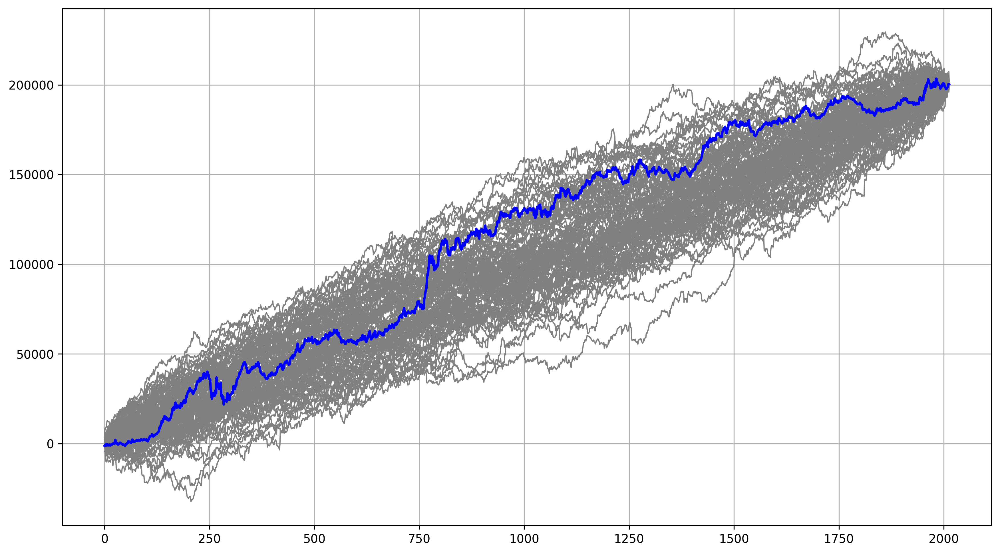

Shuffles executed in: 0:00:04.311131


In [25]:
max_drawdown_list = []
fraction = OperationsPercentage / 100

plt.subplots(figsize = (14, 8), dpi = 300)

i = 0
start = datetime.datetime.now()
while i < NumberOfShuffles:
    my_permutation = original_operations.sample(frac = fraction).reset_index(drop = True)
    my_permutation = pd.Series(my_permutation)
    new_equity = my_permutation.cumsum()
    new_drawdown = drawdown(new_equity)
    matrix_of_equities["shuffle_" + str(i + 1)] = new_equity
    matrix_of_drawdowns["shuffle_" + str(i + 1)] = new_drawdown
    max_drawdown_list.append(new_drawdown.min())
    plt.plot(new_equity, color="grey", linewidth=1, linestyle="-")
    i += 1
    
plt.plot(original_equity.reset_index(drop=True), color="blue", linewidth=2, linestyle="-")
plt.grid(True)
plt.show()

end = datetime.datetime.now()
timespent = end - start
print("Shuffles executed in:", timespent)

In [26]:
matrix_of_equities.head(10)

,original,shuffle_1,shuffle_2,shuffle_3,shuffle_4,shuffle_5,shuffle_6,shuffle_7,shuffle_8,shuffle_9,...,shuffle_91,shuffle_92,shuffle_93,shuffle_94,shuffle_95,shuffle_96,shuffle_97,shuffle_98,shuffle_99,shuffle_100
0,-1210.0,-650.0,170.0,-280.0,-280.0,70.0,590.0,190.0,-10.0,-620.0,...,-420.0,-110.0,-6.400000e+02,-800.0,-190.0,-520.0,2430.0,270.0,900.0,-350.0
1,-860.0,-880.0,-40.0,-90.0,-280.0,-150.0,360.0,-1930.0,-250.0,-1390.0,...,-800.0,1770.0,-4.900000e+02,-540.0,370.0,1200.0,2210.0,1510.0,3250.0,8430.0
2,-1020.0,3060.0,320.0,-60.0,-460.0,190.0,340.0,-1280.0,-1200.0,-3000.0,...,-2840.0,2180.0,-8.800000e+02,-410.0,250.0,1090.0,2200.0,3500.0,3370.0,7970.0
3,-1280.0,2390.0,110.0,-350.0,-430.0,-320.0,-220.0,-280.0,-640.0,-2820.0,...,-3300.0,530.0,-4.547474e-11,960.0,20.0,-1170.0,1920.0,3690.0,4150.0,8970.0
4,-280.0,3080.0,-60.0,-90.0,140.0,930.0,1670.0,-1070.0,1730.0,-3170.0,...,-1950.0,70.0,-2.000000e+01,950.0,410.0,-2630.0,2060.0,3770.0,4420.0,9140.0
5,-540.0,3900.0,1810.0,80.0,90.0,700.0,610.0,-1210.0,2460.0,-2140.0,...,-2830.0,220.0,5.500000e+02,320.0,-510.0,-2380.0,2340.0,2780.0,3630.0,10740.0
6,-910.0,6240.0,1690.0,-170.0,-240.0,-770.0,-90.0,-1050.0,4450.0,-1510.0,...,-1960.0,320.0,-5.200000e+02,1090.0,-1090.0,-2220.0,2690.0,4400.0,3270.0,12600.0
7,-380.0,6910.0,1600.0,760.0,1130.0,-620.0,180.0,-1860.0,4140.0,-1240.0,...,-2090.0,-1140.0,-1.000000e+02,-3260.0,-550.0,-1260.0,3220.0,3090.0,3310.0,12880.0
8,-1000.0,9620.0,1680.0,1400.0,1620.0,-1320.0,-270.0,-2430.0,4390.0,-1050.0,...,-760.0,1290.0,-1.030000e+03,-3420.0,390.0,-330.0,3130.0,4090.0,1650.0,12250.0
9,-760.0,9900.0,830.0,770.0,1020.0,580.0,60.0,-2030.0,5190.0,-1100.0,...,-1430.0,900.0,-6.800000e+02,-2490.0,-1590.0,-620.0,3290.0,3540.0,890.0,12260.0


In [27]:
matrix_of_drawdowns.head(10)

,original,shuffle_1,shuffle_2,shuffle_3,shuffle_4,shuffle_5,shuffle_6,shuffle_7,shuffle_8,shuffle_9,...,shuffle_91,shuffle_92,shuffle_93,shuffle_94,shuffle_95,shuffle_96,shuffle_97,shuffle_98,shuffle_99,shuffle_100
0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,-230.0,-210.0,0.0,-2.273737e-11,-220.0,-230.0,-2120.0,-240.0,-770.0,...,-380.0,0.0,0.0,0.0,0.0,0.0,-220.0,0.0,0.0,0.0
2,-510.0,0.0,0.0,0.0,-1.800000e+02,0.0,-250.0,-1470.0,-1190.0,-2380.0,...,-2420.0,0.0,-390.0,0.0,-120.0,-110.0,-230.0,0.0,0.0,-460.0
3,-610.0,-670.0,-210.0,-290.0,-1.500000e+02,-510.0,-810.0,-470.0,-630.0,-2200.0,...,-2880.0,-1650.0,0.0,0.0,-350.0,-2370.0,-510.0,0.0,0.0,0.0
4,0.0,0.0,-380.0,-30.0,0.000000e+00,0.0,0.0,-1260.0,0.0,-2550.0,...,-1530.0,-2110.0,-20.0,-10.0,0.0,-3830.0,-370.0,0.0,0.0,0.0
5,-1260.0,0.0,0.0,0.0,-5.000000e+01,-230.0,-1060.0,-1400.0,0.0,-1520.0,...,-2410.0,-1960.0,0.0,-640.0,-920.0,-3580.0,-90.0,-990.0,-790.0,0.0
6,-1370.0,0.0,-120.0,-250.0,-3.800000e+02,-1700.0,-1760.0,-1240.0,0.0,-890.0,...,-1540.0,-1860.0,-1070.0,0.0,-1500.0,-3420.0,0.0,0.0,-1150.0,0.0
7,-470.0,0.0,-210.0,0.0,0.000000e+00,-1550.0,-1490.0,-2050.0,-310.0,-620.0,...,-1670.0,-3320.0,-650.0,-4350.0,-960.0,-2460.0,0.0,-1310.0,-1110.0,0.0
8,-1620.0,0.0,-130.0,0.0,0.000000e+00,-2250.0,-1940.0,-2620.0,-60.0,-430.0,...,-340.0,-890.0,-1580.0,-4510.0,-20.0,-1530.0,-90.0,-310.0,-2770.0,-630.0
9,-760.0,0.0,-980.0,-630.0,-6.000000e+02,-350.0,-1610.0,-2220.0,0.0,-480.0,...,-1010.0,-1280.0,-1230.0,-3580.0,-2000.0,-1820.0,0.0,-860.0,-3530.0,-620.0


In [28]:
#matrix_drawdown_list = []
#for column in matrix_of_drawdowns.columns:
 #   matrix_drawdown_list.append(round(matrix_of_drawdowns[column].min(),2))
#matrix_drawdown_list

In [29]:
# we write on csv files the contents of each matrix
# matrix_of_equities.drop(0,axis=1,inplace=True)
matrix_of_equities.to_csv('matrix_of_equities.csv', sep=',', decimal='.', index=False)
matrix_of_drawdowns.to_csv('matrix_of_drawdowns.csv', sep=',', decimal='.', index=False)

### Statistics

Peggior Draw Down della Montecarlo

In [30]:
worst_drawdown = round(matrix_of_drawdowns.min().min(),2)
worst_drawdown

-45320.0

In [31]:
worst_drawdown_index = matrix_of_drawdowns.min().idxmin(axis=1)
worst_drawdown_index

'shuffle_66'

In [32]:
worst_drawdown_profit = round(matrix_of_equities[worst_drawdown_index]\
                                                [matrix_of_equities[worst_drawdown_index].count()-1],2)
worst_drawdown_profit

200370.0

Miglior Draw Down della Montecarlo

In [33]:
best_drawdown = round(matrix_of_drawdowns.min().max(),2)
best_drawdown

-11800.0

In [34]:
best_drawdown_index = matrix_of_drawdowns.min().idxmax(axis=1)
best_drawdown_index

'shuffle_12'

In [36]:
best_drawdown_profit = round(matrix_of_equities[best_drawdown_index]\
                                               [matrix_of_equities[best_drawdown_index].count()-1],2)
best_drawdown_profit

200370.0

In [37]:
print("Original Profit/Loss: ", original_profit)
print("Original Max Draw Down: ", original_max_drawdown)
print("")
print("Worst Equity Index: ", worst_drawdown_index)
print("Worst Equity Profit/Loss: ", worst_drawdown_profit)
print("Worst Equity Max Draw Down: ", worst_drawdown)
print("")
print("Best Equity Index: ", best_drawdown_index)
print("Best Equity Profit/Loss: ", best_drawdown_profit)
print("Best Equity Max Draw Down: ", best_drawdown)
print("")

Original Profit/Loss:  200370.0
Original Max Draw Down:  -15790.0

Worst Equity Index:  shuffle_66
Worst Equity Profit/Loss:  200370.0
Worst Equity Max Draw Down:  -45320.0

Best Equity Index:  shuffle_12
Best Equity Profit/Loss:  200370.0
Best Equity Max Draw Down:  -11800.0



#### Rapportiamo il rischio atteso al 95° percentile della distribuzione dei draw down:

In [38]:
MaxDrawDown95 = round(np.percentile(max_drawdown_list, 5),2)
riskfactor95 = round(np.percentile(max_drawdown_list, 5) / original_max_drawdown, 2)
riskfactor = round(min(max_drawdown_list) / original_max_drawdown, 2)

print("95 Percentile Montecarlo Max Draw Down: ", MaxDrawDown95)
print("Montecarlo Risk Factor on 95 Percentile Probability: ", riskfactor95)
print("Worst Montecarlo Max Draw Down: ", round(min(max_drawdown_list),2))
print("Montecarlo Risk Factor on Max Draw Down: ", riskfactor)
print("")

95 Percentile Montecarlo Max Draw Down:  -31675.0
Montecarlo Risk Factor on 95 Percentile Probability:  2.01
Worst Montecarlo Max Draw Down:  -45320.0
Montecarlo Risk Factor on Max Draw Down:  2.87



#### Grafichiamo la migliore, la peggiore e l'equity line originale:

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  del sys.path[0]


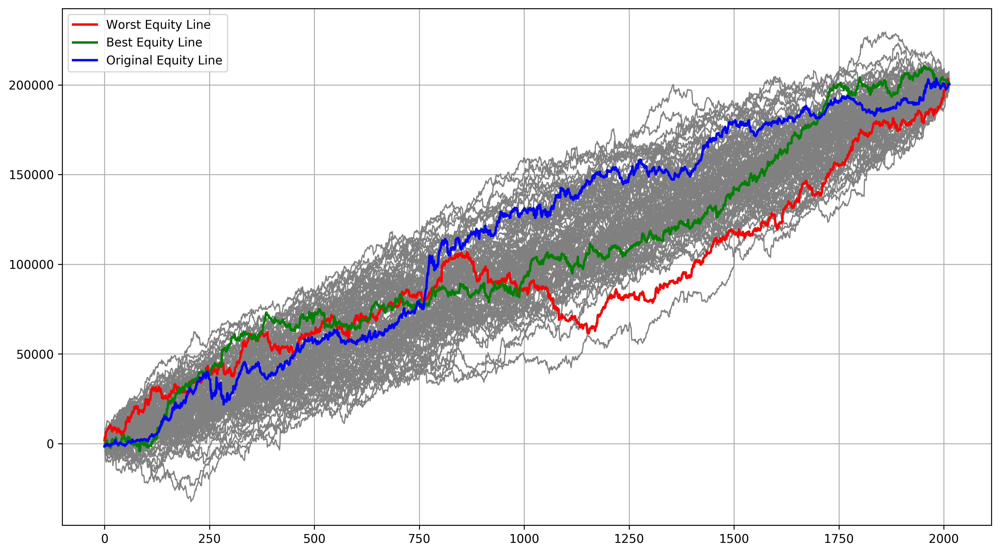

In [39]:
plt.subplots(figsize=(14, 8), dpi=300)
plt.plot(matrix_of_equities.iloc[:,1:], color="grey", linewidth=1, linestyle="-")
plt.plot(matrix_of_equities[worst_drawdown_index], color="red", linewidth=2, linestyle="-", label="Worst Equity Line")
plt.plot(matrix_of_equities[best_drawdown_index], color="green", linewidth=2, linestyle="-", label="Best Equity Line")

if OperationsPercentage == 100:
    plt.plot(original_equity.reset_index(drop=True), color="blue", linewidth=2, linestyle="-", label="Original Equity Line")
else:
    plt.plot(original_equity.reset_index(drop=True)[:cutnumber], color="blue", linewidth=2, linestyle="-")

plt.grid(True)
plt.legend()
plt.savefig("Shuffle_1.png")
plt.show()

#### Grafichiamo la distribuzione di tutti i draw down dello shuffle:

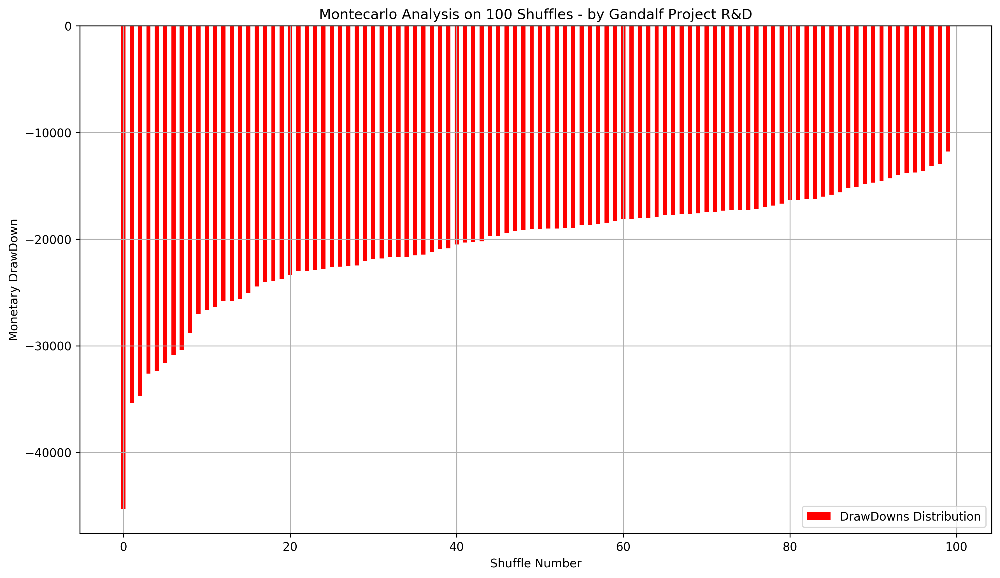

In [40]:
output = []
output = sorted(max_drawdown_list)

# Multiple Hinstogram Graph
n_groups = NumberOfShuffles

# We open a figure where to plot all curves
plt.figure(figsize=(14, 8), dpi=300)

# fig, ax = plt.subplots()

index = np.arange(n_groups)
bar_width = 0.5

opacity = 1
error_config = {'ecolor': '0.3'}

rects1 = plt.bar(index, output, bar_width,
                  alpha=opacity,
                  color='red',
                  error_kw=error_config,
                  label='DrawDowns Distribution')

plt.xlabel('Shuffle Number')
plt.ylabel('Monetary DrawDown')
plt.title('Montecarlo Analysis on ' + str(NumberOfShuffles) + ' Shuffles - by Gandalf Project R&D')
plt.legend()
plt.grid(True)
plt.savefig("Shuffle_2.png")
plt.show()

No handles with labels found to put in legend.


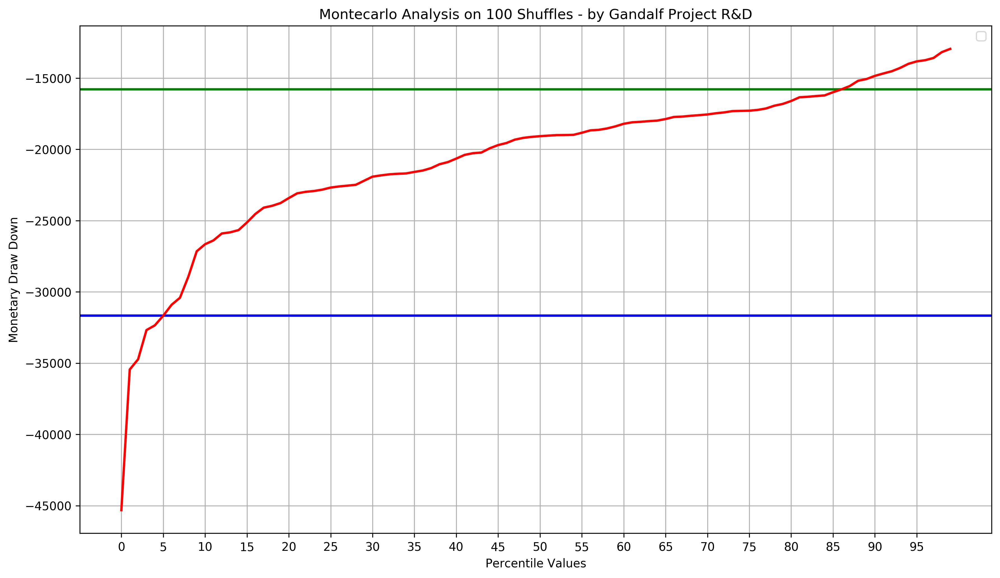

In [41]:
Percentiles = np.zeros(100)
i = 0
while i < 100:
    Percentiles[i] = np.percentile(max_drawdown_list, int(i))
    # print("Percentile " + str(i+1) + ": " + str(Percentiles[i]))
    i += 1

plt.figure(figsize=(14, 8), dpi=300)

plt.xlabel('Percentile Values')
plt.ylabel('Monetary Draw Down')
plt.title('Montecarlo Analysis on ' + str(NumberOfShuffles) + ' Shuffles - by Gandalf Project R&D')
plt.axhline(y=int(original_max_drawdown), xmin=0, xmax=100, linewidth=2, color='green')
plt.axhline(y=int(MaxDrawDown95), xmin=0, xmax=100, linewidth=2, color='blue')
plt.plot(Percentiles, color="red", linewidth=2, linestyle="-")
plt.xticks(np.arange(0, 99, 5.0))
plt.grid(True)
plt.legend()
plt.savefig("Shuffle_3.png")
plt.show()

## Uniamo i pezzi in un unico codice:

In [4]:
def costs_adder(operations, costs):
    """
    Per ogni operazione sottraiamo il doppio dei costi fissi (round turn)
    """
    new_operations = operations.apply(lambda x: x - 2 * costs)
    return new_operations

def noise_adder(operations, percentage_noise_addiction):
    """
    Funzione che modifica ciascun elemento dell'array di ingresso mediante la formula:
    new_array[i] = array[i] + factor * percentage * range[i]
    Di fatto si aggiunge una componente di rumore positiva o negativa 
    proporzionale all'estensione monetaria del trade
    """
    new_operations = []
    for el in operations:
        factor = np.random.uniform(-1, 1)
        new_operations.append(round(el + factor * (percentage_noise_addiction / 100) * abs(el),2))
    new_operations_series = pd.Series(new_operations, index=operations.index, name="operations")
    return new_operations_series

In [7]:
def evolved_montecarlo_analysis(Costs,PercentageNoiseAddiction,OperationsPercentage,NumberOfShuffles):
    
    original_operations = operations

    if Costs != 0:
        original_operations = costs_adder(operations, Costs)

    if PercentageNoiseAddiction != 0:
        original_operations = noise_adder(operations, PercentageNoiseAddiction)

    original_equity = original_operations.cumsum()
    original_profit = round(original_operations.sum(),2)
    original_drawdown = drawdown(original_operations)
    original_max_drawdown = round(original_drawdown.min(),2)
    
    if OperationsPercentage == 100:
        matrix_of_equities = pd.DataFrame(original_equity).reset_index()
        matrix_of_equities.drop(matrix_of_equities.columns[0], axis=1, inplace=True)
        matrix_of_equities.columns = ["original"]
        matrix_of_drawdowns = pd.DataFrame(original_drawdown).reset_index()
        matrix_of_drawdowns.drop(matrix_of_drawdowns.columns[0], axis=1, inplace=True)
        matrix_of_drawdowns.columns = ["original"]
    else:
        cutnumber = int(len(operations) * int(OperationsPercentage) / 100)
        matrix_of_equities = pd.DataFrame(original_equity[:cutnumber]).reset_index()
        matrix_of_equities.drop(matrix_of_equities.columns[0], axis=1, inplace=True)
        matrix_of_equities.columns = ["original"]
        matrix_of_drawdowns = pd.DataFrame(original_drawdown[:cutnumber]).reset_index()
        matrix_of_drawdowns.drop(matrix_of_drawdowns.columns[0], axis=1, inplace=True)
        matrix_of_drawdowns.columns = ["original"]

    max_drawdown_list = []
    fraction = OperationsPercentage / 100
    i = 0
    start = datetime.datetime.now()
    while i < NumberOfShuffles:
        my_permutation = original_operations.sample(frac = fraction).reset_index(drop = True)
        my_permutation = pd.Series(my_permutation)
        new_equity = my_permutation.cumsum()
        new_drawdown = drawdown(new_equity)
        matrix_of_equities["shuffle_" + str(i + 1)] = new_equity
        matrix_of_drawdowns["shuffle_" + str(i + 1)] = new_drawdown
        max_drawdown_list.append(new_drawdown.min())
        i += 1

    end = datetime.datetime.now()
    timespent = end - start
    print("Shuffles executed in:", timespent)
    print("")
      
    matrix_of_equities.to_csv('matrix_of_equities.csv', sep=',', decimal='.', index=False)
    matrix_of_drawdowns.to_csv('matrix_of_drawdowns.csv', sep=',', decimal='.', index=False)
    
    worst_drawdown = round(matrix_of_drawdowns.min().min(),2)
    worst_drawdown_index = matrix_of_drawdowns.min().idxmin(axis=1)
    worst_drawdown_profit = round(matrix_of_equities[worst_drawdown_index]\
                                                    [matrix_of_equities[worst_drawdown_index].count()-1],2)

    best_drawdown = round(matrix_of_drawdowns.min().max(),2)
    best_drawdown_index = matrix_of_drawdowns.min().idxmax(axis=1)
    best_drawdown_profit = round(matrix_of_equities[best_drawdown_index]\
                                                   [matrix_of_equities[best_drawdown_index].count()-1],2)

    print("Original Profit/Loss: ", original_profit)
    print("Original Max Draw Down: ", original_max_drawdown)
    print("")
    print("Worst Equity Index: ", worst_drawdown_index)
    print("Worst Equity Profit/Loss: ", worst_drawdown_profit)
    print("Worst Equity Max Draw Down: ", worst_drawdown)
    print("")
    print("Best Equity Index: ", best_drawdown_index)
    print("Best Equity Profit/Loss: ", best_drawdown_profit)
    print("Best Equity Max Draw Down: ", best_drawdown)
    print("")

    MaxDrawDown95 = round(np.percentile(max_drawdown_list, 5),2)
    riskfactor95 = round(np.percentile(max_drawdown_list, 5) / original_max_drawdown, 2)
    riskfactor = round(min(max_drawdown_list) / original_max_drawdown, 2)

    print("95 Percentile Montecarlo Max Draw Down: ", MaxDrawDown95)
    print("Montecarlo Risk Factor on 95 Percentile Probability: ", riskfactor95)
    print("Worst Montecarlo Max Draw Down: ", round(min(max_drawdown_list),2))
    print("Montecarlo Risk Factor on Max Draw Down: ", riskfactor)
    print("")

    # GRAPH 1
    plt.subplots(figsize=(14, 8), dpi=300)
    plt.plot(matrix_of_equities.iloc[:,1:], color="grey", linewidth=1, linestyle="-")
    plt.plot(matrix_of_equities[worst_drawdown_index], color="red", linewidth=2, linestyle="-", 
             label="Worst Equity Line")
    plt.plot(matrix_of_equities[best_drawdown_index], color="green", linewidth=2, linestyle="-", 
             label="Best Equity Line")

    if OperationsPercentage == 100:
        plt.plot(original_equity.reset_index(drop=True), color="blue", linewidth=2, linestyle="-", 
                 label="Original Equity Line")
    else:
        plt.plot(original_equity.reset_index(drop=True)[:cutnumber], color="blue", linewidth=2, linestyle="-")

    plt.grid(True)
    plt.legend()
    plt.savefig("Shuffle_1.png")
    plt.show()
    
    # GRAPH 2
    output = []
    output = sorted(max_drawdown_list)
    n_groups = NumberOfShuffles
    plt.figure(figsize=(14, 8), dpi=300)
    index = np.arange(n_groups)
    bar_width = 0.5
    opacity = 1
    error_config = {'ecolor': '0.3'}

    rects1 = plt.bar(index, output, bar_width,
                      alpha=opacity,
                      color='red',
                      error_kw=error_config,
                      label='DrawDowns Distribution')

    plt.xlabel('Shuffle Number')
    plt.ylabel('Monetary DrawDown')
    plt.title('Montecarlo Analysis on ' + str(NumberOfShuffles) + ' Shuffles - by Gandalf Project R&D')
    plt.legend()
    plt.grid(True)
    plt.savefig("Shuffle_2.png")
    plt.show()
    
    # GRAPH 3
    Percentiles = np.zeros(100)
    i = 0
    while i < 100:
        Percentiles[i] = np.percentile(max_drawdown_list, int(i))
        i += 1

    plt.figure(figsize=(14, 8), dpi=300)
    plt.xlabel('Percentile Values')
    plt.ylabel('Monetary Draw Down')
    plt.title('Montecarlo Analysis on ' + str(NumberOfShuffles) + ' Shuffles - by Gandalf Project R&D')
    plt.axhline(y=int(original_max_drawdown), xmin=0, xmax=100, linewidth=2, color='green')
    plt.axhline(y=int(MaxDrawDown95), xmin=0, xmax=100, linewidth=2, color='blue')
    plt.plot(Percentiles, color="red", linewidth=2, linestyle="-")
    plt.xticks(np.arange(0, 99, 5.0))
    plt.grid(True)
    plt.legend()
    plt.savefig("Shuffle_3.png")
    plt.show()
    return

Shuffles executed in: 0:00:00.260105

Original Profit/Loss:  200370.0
Original Max Draw Down:  -15790.0

Worst Equity Index:  shuffle_63
Worst Equity Profit/Loss:  200370.0
Worst Equity Max Draw Down:  -41390.0

Best Equity Index:  shuffle_68
Best Equity Profit/Loss:  200370.0
Best Equity Max Draw Down:  -12020.0

95 Percentile Montecarlo Max Draw Down:  -29386.0
Montecarlo Risk Factor on 95 Percentile Probability:  1.86
Worst Montecarlo Max Draw Down:  -41390.0
Montecarlo Risk Factor on Max Draw Down:  2.62



/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:107: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


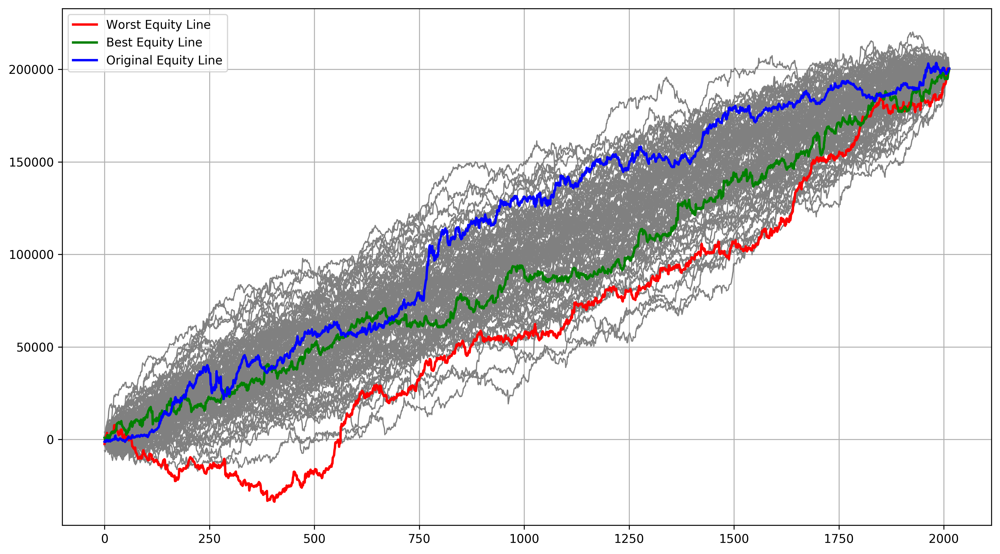

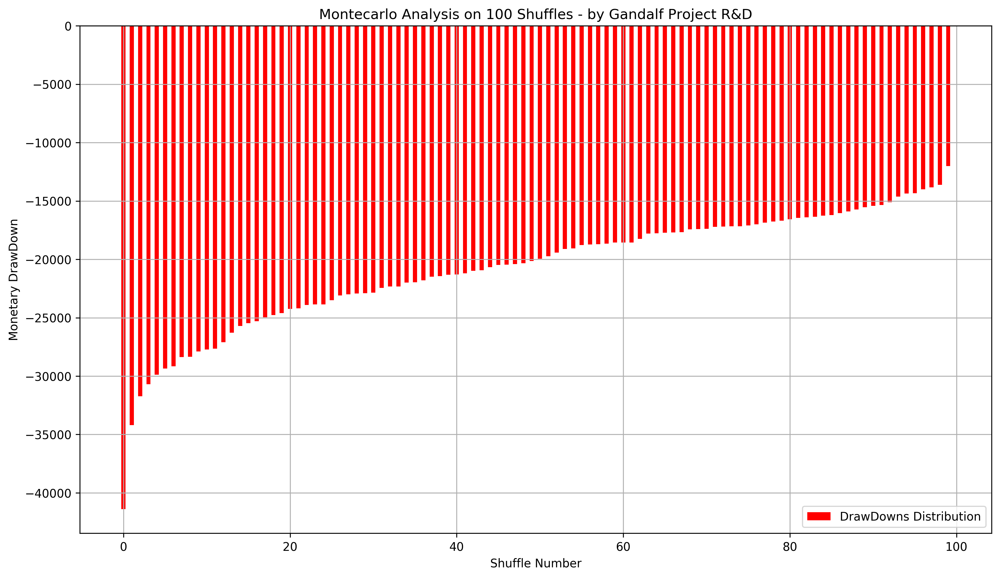

No handles with labels found to put in legend.


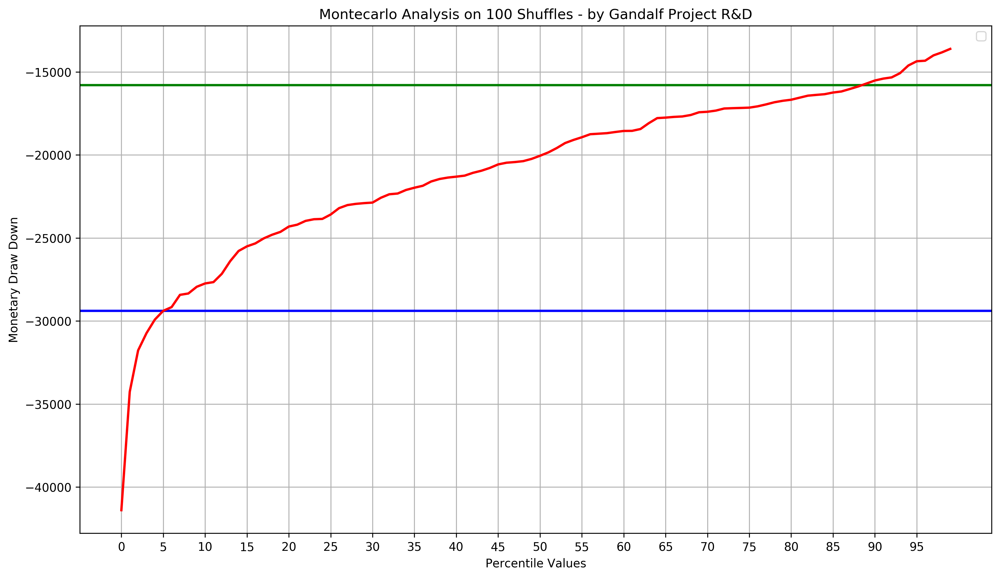

In [13]:
Costs = 0

PercentageNoiseAddiction = 0
# ogni trade è addizionato con una massima percentuale del valore nominale del trade, 
# equivalente a PercentageNoiseAddiction
# 0 significa nessun rumore aggiunto
# esempio: 25 significa che aggiungiamo un massimo del 25% del range per ciascun trade

OperationsPercentage = 100

NumberOfShuffles = 100

evolved_montecarlo_analysis(Costs,PercentageNoiseAddiction,OperationsPercentage,NumberOfShuffles)

### Simuliamo di aggiungere un costo di 20 $ per operazione round turn:

Shuffles executed in: 0:00:00.183815

Original Profit/Loss:  119810.0
Original Max Draw Down:  -15790.0

Worst Equity Index:  shuffle_36
Worst Equity Profit/Loss:  119810.0
Worst Equity Max Draw Down:  -51200.0

Best Equity Index:  shuffle_85
Best Equity Profit/Loss:  119810.0
Best Equity Max Draw Down:  -14440.0

95 Percentile Montecarlo Max Draw Down:  -42224.5
Montecarlo Risk Factor on 95 Percentile Probability:  2.67
Worst Montecarlo Max Draw Down:  -51200.0
Montecarlo Risk Factor on Max Draw Down:  3.24



/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:107: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


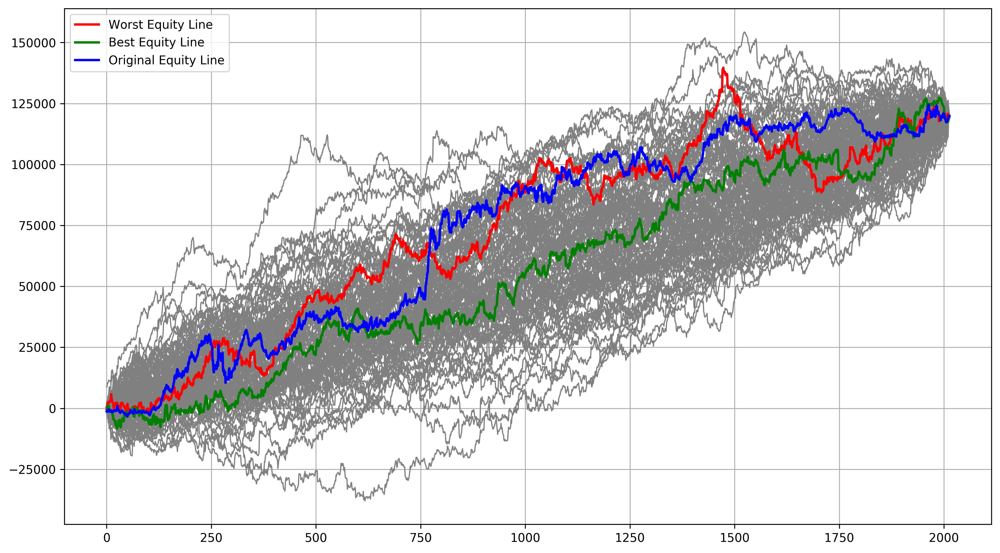

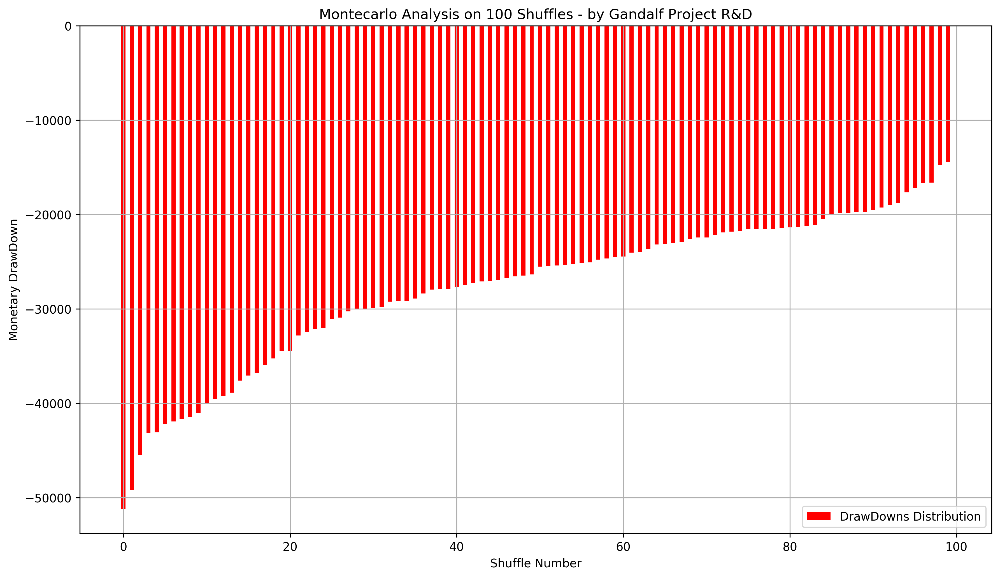

No handles with labels found to put in legend.


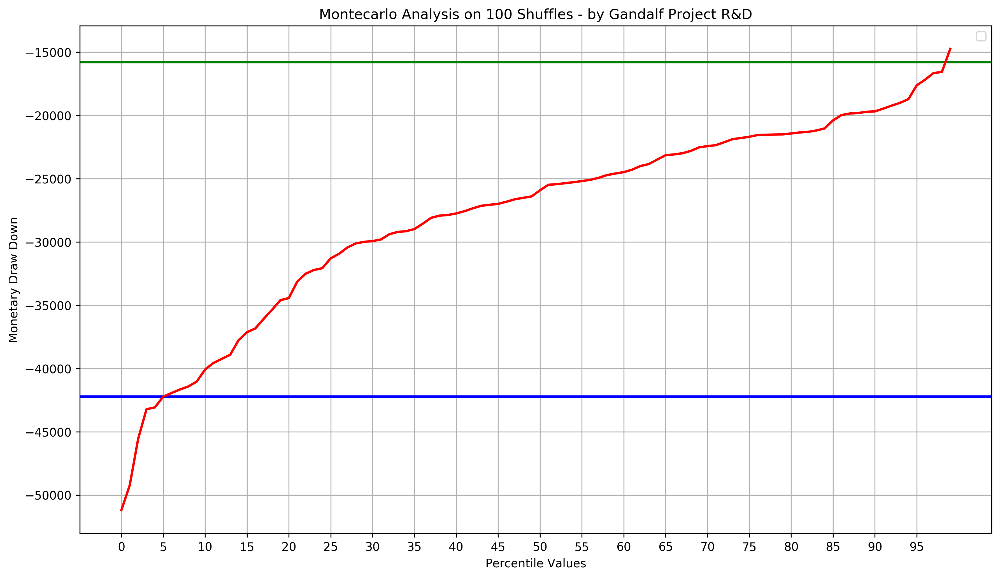

In [10]:
Costs = 20

PercentageNoiseAddiction = 0
# any trade is added with a max percentage of absolute trade value equal to PercentageNoiseAddiction
# 0 means no noise addiction on each trade
# 25 is a maximum of 25% of each trade range

OperationsPercentage = 100

NumberOfShuffles = 100

evolved_montecarlo_analysis(Costs,PercentageNoiseAddiction,OperationsPercentage,NumberOfShuffles)

### Simuliamo di sfumare i trade con un rumore del 50%:

Shuffles executed in: 0:00:00.205335

Original Profit/Loss:  201652.77
Original Max Draw Down:  -15116.86

Worst Equity Index:  shuffle_27
Worst Equity Profit/Loss:  201652.77
Worst Equity Max Draw Down:  -47010.17

Best Equity Index:  shuffle_30
Best Equity Profit/Loss:  201652.77
Best Equity Max Draw Down:  -12557.99

95 Percentile Montecarlo Max Draw Down:  -33015.4
Montecarlo Risk Factor on 95 Percentile Probability:  2.18
Worst Montecarlo Max Draw Down:  -47010.17
Montecarlo Risk Factor on Max Draw Down:  3.11



/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:107: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


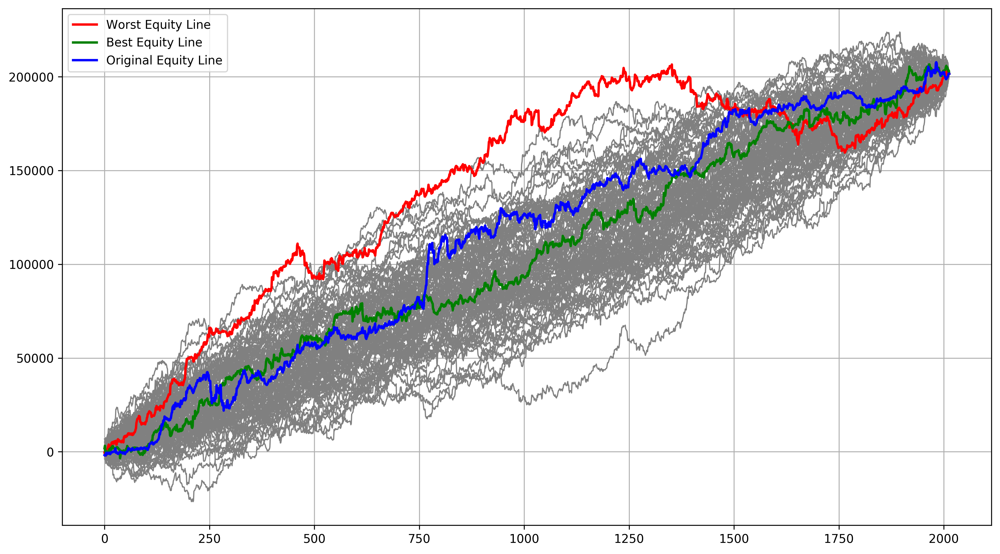

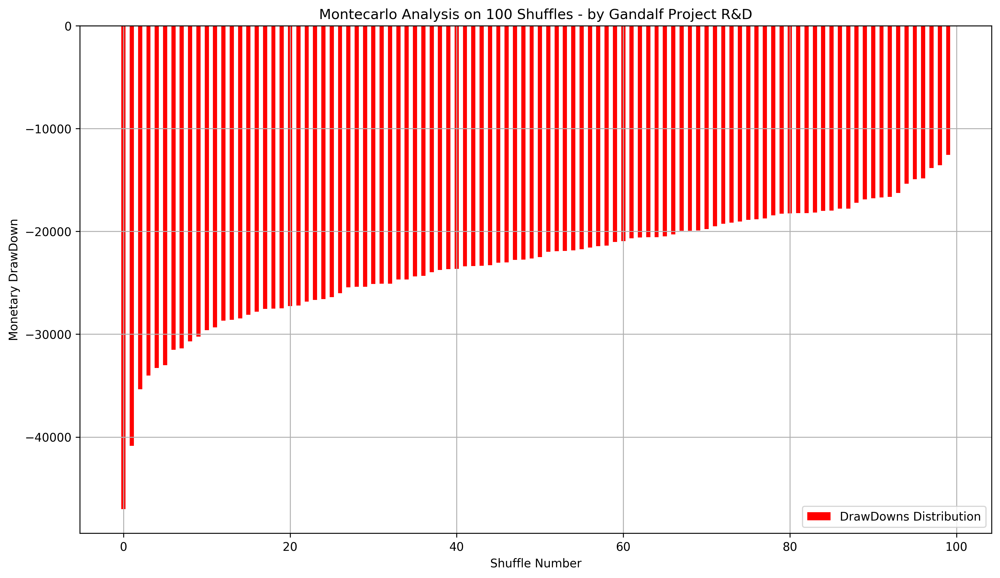

No handles with labels found to put in legend.


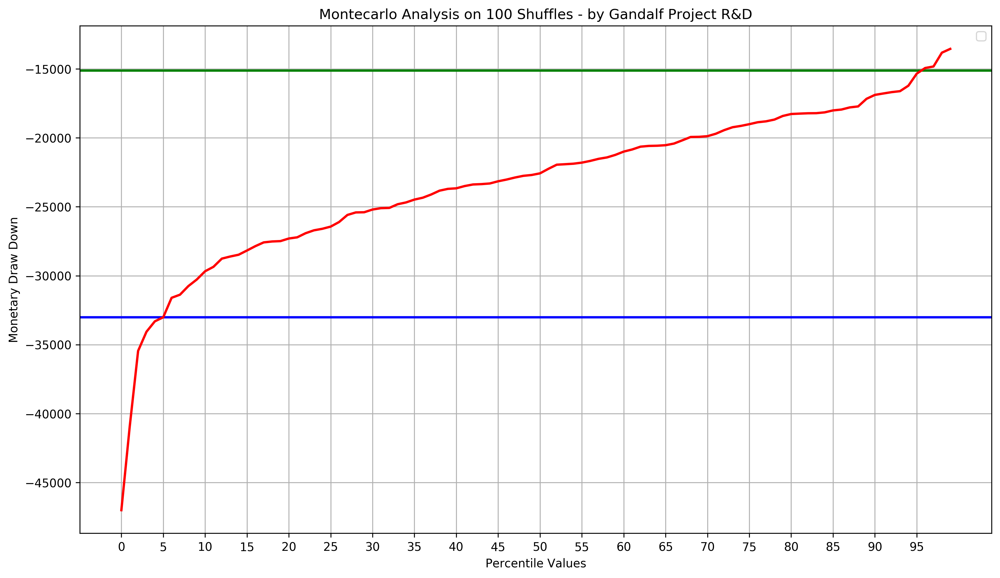

In [14]:
Costs = 0

PercentageNoiseAddiction = 50
# any trade is added with a max percentage of absolute trade value equal to PercentageNoiseAddiction
# 0 means no noise addiction on each trade
# 25 is a maximum of 25% of each trade range

OperationsPercentage = 100

NumberOfShuffles = 100

evolved_montecarlo_analysis(Costs,PercentageNoiseAddiction,OperationsPercentage,NumberOfShuffles)

### Infine ricombiniamo soltanto il 70% dei trade originari:

Shuffles executed in: 0:00:00.230899

Original Profit/Loss:  200370.0
Original Max Draw Down:  -15790.0

Worst Equity Index:  shuffle_23
Worst Equity Profit/Loss:  102140.0
Worst Equity Max Draw Down:  -38910.0

Best Equity Index:  shuffle_9
Best Equity Profit/Loss:  143640.0
Best Equity Max Draw Down:  -10100.0

95 Percentile Montecarlo Max Draw Down:  -31958.5
Montecarlo Risk Factor on 95 Percentile Probability:  2.02
Worst Montecarlo Max Draw Down:  -38910.0
Montecarlo Risk Factor on Max Draw Down:  2.46



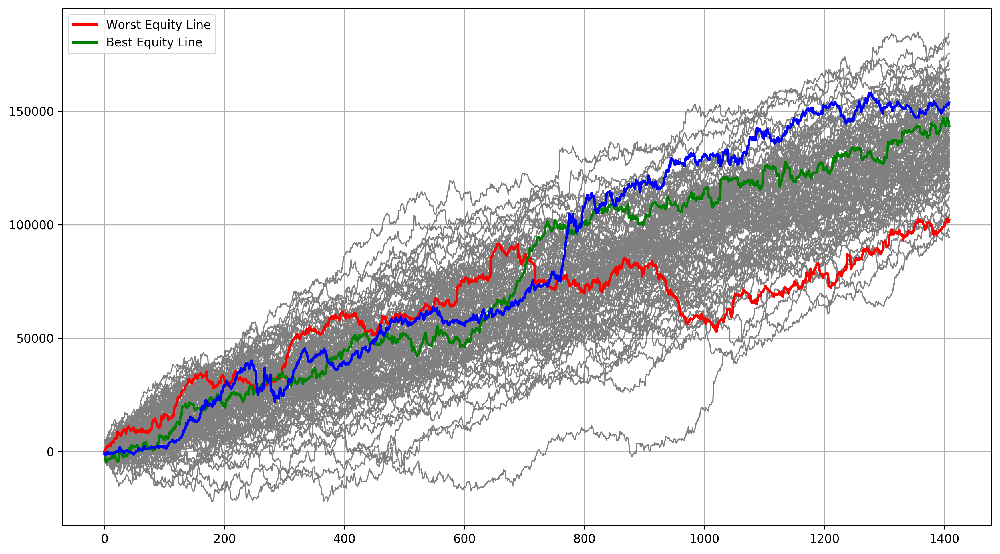

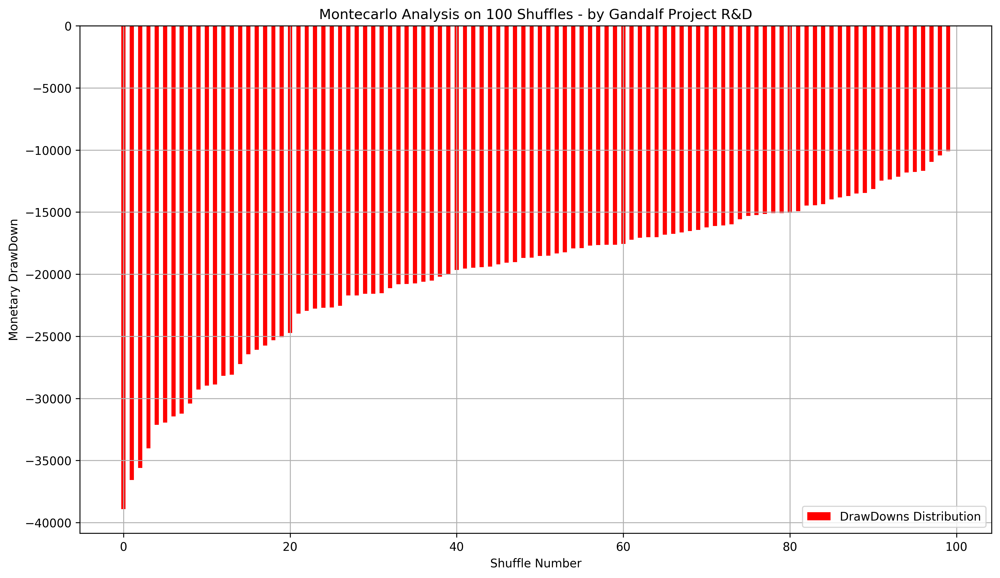

No handles with labels found to put in legend.


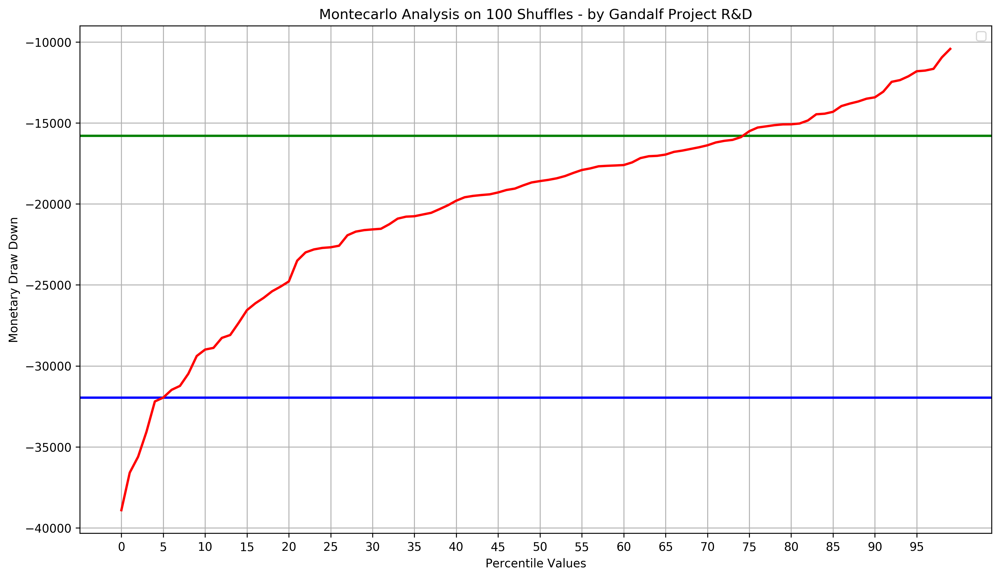

In [12]:
Costs = 0

PercentageNoiseAddiction = 0
# any trade is added with a max percentage of absolute trade value equal to PercentageNoiseAddiction
# 0 means no noise addiction on each trade
# 25 is a maximum of 25% of each trade range

OperationsPercentage = 70

NumberOfShuffles = 100

evolved_montecarlo_analysis(Costs,PercentageNoiseAddiction,OperationsPercentage,NumberOfShuffles)